In [12]:
from io import BytesIO
from PIL import Image
import numpy as np

import rasterio
from cmap import Colormap

In [13]:
viridis = Colormap("matplotlib:viridis")

In [14]:
INPUT_PATH = "/mnt/data/workspace/bogor-agrisat/data/production-data/environmental/msavi/20260331T112509.tif"

with rasterio.open(INPUT_PATH) as src:
    print(src.bounds)

    img_data = src.read(1)
    if src.nodata is not None:
        img_data = np.where(img_data == src.nodata, np.nan, img_data)

    min_val = np.nanmin(img_data)
    max_val = np.nanmax(img_data)
    normalized_band = (img_data - min_val) / (max_val - min_val)

    # 2. Convert NaNs or leftover NoData values to 0 (black)
    cmap = Colormap("matplotlib:viridis")
    rgba_uint8 = cmap(normalized_band, bytes=True)

    # 3. Create a PIL Image and save it to disk
    img = Image.fromarray(rgba_uint8)

BoundingBox(left=654930.0, bottom=9249210.0, right=746260.0, top=9303020.0)


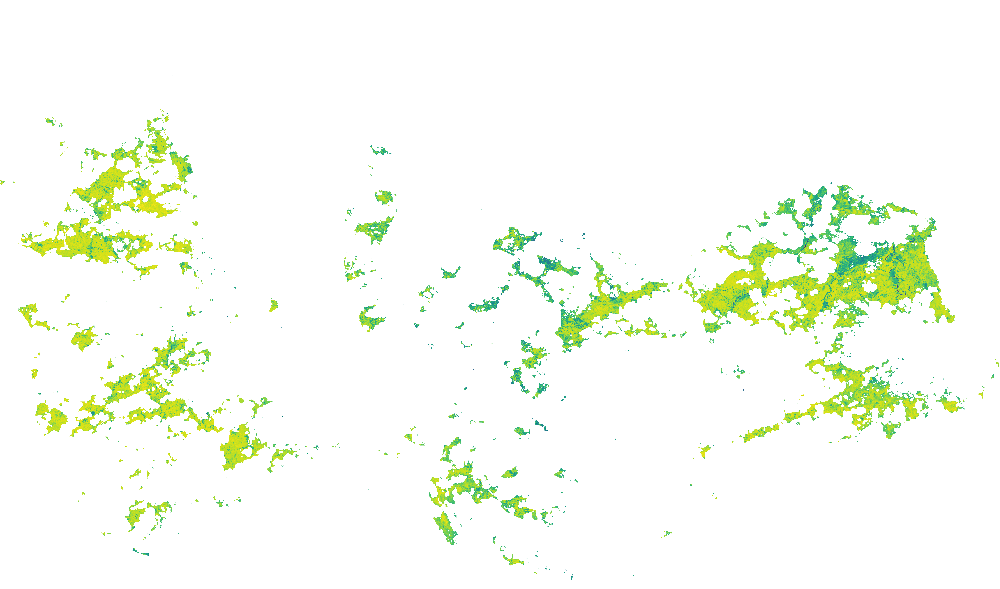

In [15]:
img